# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# run this once to unzip the file
# !unzip processed-celeba-small.zip

In [2]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, CenterCrop
from natsort import natsorted
import os
import tests_

In [3]:
data_dir = 'processed-celeba-small/processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [4]:
from torchvision.transforms import Compose, ToTensor, Resize, Normalize
from torchvision.transforms.functional import rotate
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [Resize(size), 
                  Normalize(mean=[0.485, 0.456, 0.406], 
                            std=[0.229, 0.224, 0.225], 
                            inplace=False), 
                  ToTensor()]    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [5]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.images_dir = directory
        self.images = []
        # self.directory = directory
        self.transforms = transforms
        for image_name in natsorted(os.listdir(self.images_dir)):
            if image_name.endswith('.jpg'):
                self.images.append(os.path.join(self.images_dir, image_name))
            
    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.images)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        x = np.asarray(Image.open(self.images[index]))
        x_norm = (x-np.min(x))/(np.max(x)-np.min(x))
        min_val, max_val = (-1, 1)
        image = x_norm * (max_val - min_val) + min_val
        return image.transpose(2, 1, 0)

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests_.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


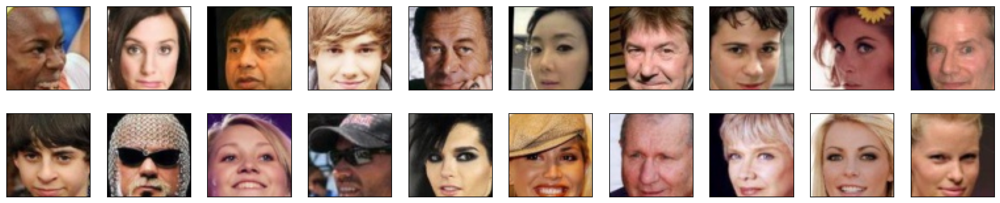

In [7]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx]
    img = np.transpose(img, (2, 1, 0))
    img = denormalize(img)
    ax.imshow(img)

The functions below will help you visualize images from the dataset.

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [8]:
from torch.nn import Module
import torch.nn as nn
import torch.nn.functional as F

In [9]:
class ConvBlock(nn.Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [10]:
class Discriminator(nn.Module):
    """
    The discriminator model adapted from the DCGAN paper. It should only contains a few layers.
    args:
    - conv_dim: control the number of filters
    """
    def __init__(self, conv_dim: int):
        super(Discriminator, self).__init__()

        # complete init function
        self.conv_dim = conv_dim

        # 32x32 input
        self.conv1 = ConvBlock(3, conv_dim, 4, batch_norm=False) # first layer, no batch_norm
        # 16x16 out
        self.conv2 = ConvBlock(conv_dim, conv_dim*2, 4)
        # 8x8 out
        self.conv3 = ConvBlock(conv_dim*2, conv_dim*4, 4)
        # 4x4 out
        
        self.flatten = nn.Flatten()
        # final, fully-connected layer
        self.fc = nn.Linear(conv_dim*4*4*4*4, 1)

    def forward(self, x):
        # all hidden layers + leaky relu activation
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        # flatten
        x = self.flatten(x)
        # final output layer
        x = self.fc(x)        
        return x

In [11]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator(conv_dim=64)
tests_.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [12]:
class DeconvBlock(nn.Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """

    def __init__(self,
                 in_channels: int,
                 out_channels: int,
                 kernel_size: int,
                 stride: int,
                 padding: int,
                 batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x


In [13]:
class Generator(nn.Module):
    """
    The generator model adapted from DCGAN
    args:
    - latent_dim: dimension of the latent vector
    - conv_dim: control the number of filters in the convtranspose layers
    """

    def __init__(self, latent_dim: int, conv_dim: int = 32):
        super(Generator, self).__init__()
        # transpose conv layers
        self.deconv1 = DeconvBlock(latent_dim, conv_dim * 4, 4, 1, 0)
        self.deconv2 = DeconvBlock(conv_dim * 4, conv_dim * 2, 4, 2, 1)
        self.deconv3 = DeconvBlock(conv_dim * 2, conv_dim, 4, 2, 1)
        self.deconv4 = nn.ConvTranspose2d(conv_dim, 3, 4, stride=4, padding=0)
        self.last_activation = nn.Tanh()

    def forward(self, x):
        x = self.deconv1(x)
        x = self.deconv2(x)
        x = self.deconv3(x)
        x = self.deconv4(x)
        x = self.last_activation(x)
        return x

In [14]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim, 64)
tests_.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [15]:
import torch.optim as optim

# params
lr = 0.0002
beta1=0.5
beta2=0.999 # default value

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [16]:
def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [17]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [18]:
#This optional block is not considered!

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [19]:
#This is redundant because this has been covered already in the training loop below.

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [20]:
from datetime import datetime

In [21]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 1

# number of images in each batch
batch_size = 16

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator(conv_dim=64).to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=16, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [23]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (2, 1, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

In [24]:
train_on_gpu = torch.cuda.is_available()

if train_on_gpu:
    # move models to GPU
    generator.cuda()
    discriminator.cuda()
    print('GPU available for training. Models moved to GPU')
else:
    print('Training on CPU.')
    

GPU available for training. Models moved to GPU


### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-03-29 08:11:31 | Epoch [1/20] | Batch 0/2037 | d_loss: 1.5170 | g_loss: 1.5660
2023-03-29 08:11:31 | Epoch [1/20] | Batch 50/2037 | d_loss: 0.0106 | g_loss: 5.8495
2023-03-29 08:11:32 | Epoch [1/20] | Batch 100/2037 | d_loss: 0.0043 | g_loss: 7.2359
2023-03-29 08:11:32 | Epoch [1/20] | Batch 150/2037 | d_loss: 0.0007 | g_loss: 8.9040
2023-03-29 08:11:32 | Epoch [1/20] | Batch 200/2037 | d_loss: 0.0029 | g_loss: 8.0507
2023-03-29 08:11:33 | Epoch [1/20] | Batch 250/2037 | d_loss: 0.0008 | g_loss: 7.7372
2023-03-29 08:11:33 | Epoch [1/20] | Batch 300/2037 | d_loss: 0.0007 | g_loss: 8.5769
2023-03-29 08:11:33 | Epoch [1/20] | Batch 350/2037 | d_loss: 0.0018 | g_loss: 8.0065
2023-03-29 08:11:34 | Epoch [1/20] | Batch 400/2037 | d_loss: 0.0222 | g_loss: 7.5794
2023-03-29 08:11:34 | Epoch [1/20] | Batch 450/2037 | d_loss: 0.0205 | g_loss: 6.5025
2023-03-29 08:11:34 | Epoch [1/20] | Batch 500/2037 | d_loss: 0.0167 | g_loss: 7.4938
2023-03-29 08:11:35 | Epoch [1/20] | Batch 550/2037 | d_l

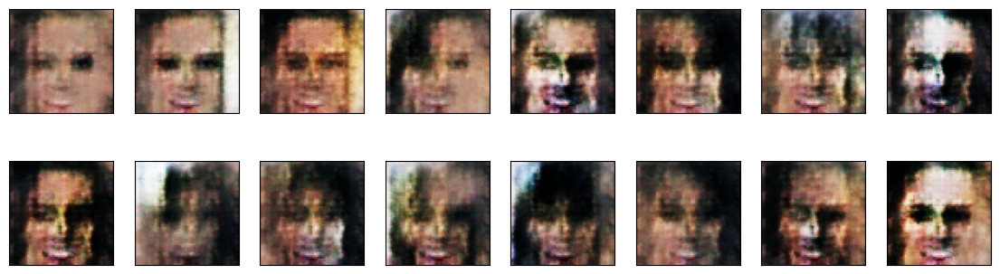

2023-03-29 08:11:47 | Epoch [2/20] | Batch 0/2037 | d_loss: 0.3837 | g_loss: 7.0534
2023-03-29 08:11:47 | Epoch [2/20] | Batch 50/2037 | d_loss: 0.0444 | g_loss: 5.5703
2023-03-29 08:11:48 | Epoch [2/20] | Batch 100/2037 | d_loss: 0.0198 | g_loss: 6.1175
2023-03-29 08:11:48 | Epoch [2/20] | Batch 150/2037 | d_loss: 0.0328 | g_loss: 5.7387
2023-03-29 08:11:48 | Epoch [2/20] | Batch 200/2037 | d_loss: 0.0723 | g_loss: 6.9791
2023-03-29 08:11:49 | Epoch [2/20] | Batch 250/2037 | d_loss: 2.0215 | g_loss: 15.0837
2023-03-29 08:11:49 | Epoch [2/20] | Batch 300/2037 | d_loss: 0.0227 | g_loss: 6.3032
2023-03-29 08:11:50 | Epoch [2/20] | Batch 350/2037 | d_loss: 0.0035 | g_loss: 10.5116
2023-03-29 08:11:50 | Epoch [2/20] | Batch 400/2037 | d_loss: 0.0263 | g_loss: 7.4402
2023-03-29 08:11:51 | Epoch [2/20] | Batch 450/2037 | d_loss: 0.0709 | g_loss: 8.2417
2023-03-29 08:11:51 | Epoch [2/20] | Batch 500/2037 | d_loss: 0.0126 | g_loss: 5.0516
2023-03-29 08:11:52 | Epoch [2/20] | Batch 550/2037 | d

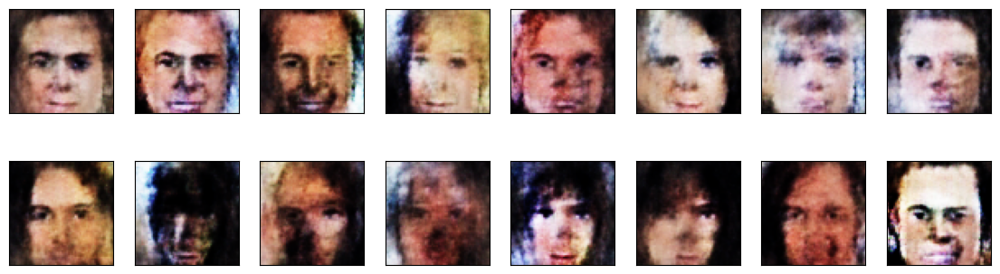

2023-03-29 08:12:06 | Epoch [3/20] | Batch 0/2037 | d_loss: 0.0922 | g_loss: 6.8377
2023-03-29 08:12:06 | Epoch [3/20] | Batch 50/2037 | d_loss: 0.0508 | g_loss: 4.8791
2023-03-29 08:12:06 | Epoch [3/20] | Batch 100/2037 | d_loss: 0.1512 | g_loss: 7.2008
2023-03-29 08:12:07 | Epoch [3/20] | Batch 150/2037 | d_loss: 0.0181 | g_loss: 10.2888
2023-03-29 08:12:07 | Epoch [3/20] | Batch 200/2037 | d_loss: 0.0878 | g_loss: 6.6634
2023-03-29 08:12:08 | Epoch [3/20] | Batch 250/2037 | d_loss: 1.2144 | g_loss: 21.2008
2023-03-29 08:12:08 | Epoch [3/20] | Batch 300/2037 | d_loss: 0.1592 | g_loss: 7.8802
2023-03-29 08:12:08 | Epoch [3/20] | Batch 350/2037 | d_loss: 0.0399 | g_loss: 7.4232
2023-03-29 08:12:09 | Epoch [3/20] | Batch 400/2037 | d_loss: 0.0487 | g_loss: 4.4974
2023-03-29 08:12:09 | Epoch [3/20] | Batch 450/2037 | d_loss: 0.0414 | g_loss: 7.1627
2023-03-29 08:12:09 | Epoch [3/20] | Batch 500/2037 | d_loss: 0.0332 | g_loss: 6.9473
2023-03-29 08:12:10 | Epoch [3/20] | Batch 550/2037 | d

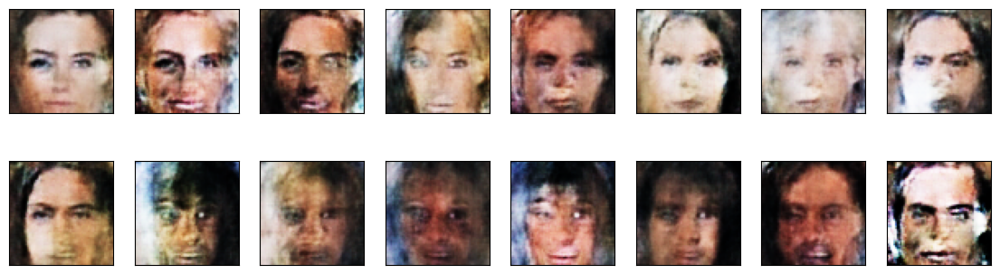

2023-03-29 08:12:22 | Epoch [4/20] | Batch 0/2037 | d_loss: 0.0174 | g_loss: 13.3873
2023-03-29 08:12:23 | Epoch [4/20] | Batch 50/2037 | d_loss: 0.0766 | g_loss: 6.9114
2023-03-29 08:12:23 | Epoch [4/20] | Batch 100/2037 | d_loss: 0.1545 | g_loss: 4.5707
2023-03-29 08:12:24 | Epoch [4/20] | Batch 150/2037 | d_loss: 0.0794 | g_loss: 5.9517
2023-03-29 08:12:24 | Epoch [4/20] | Batch 200/2037 | d_loss: 0.0101 | g_loss: 6.7347
2023-03-29 08:12:24 | Epoch [4/20] | Batch 250/2037 | d_loss: 0.3101 | g_loss: 14.0708
2023-03-29 08:12:25 | Epoch [4/20] | Batch 300/2037 | d_loss: 0.0176 | g_loss: 8.0607
2023-03-29 08:12:25 | Epoch [4/20] | Batch 350/2037 | d_loss: 0.0153 | g_loss: 7.3391
2023-03-29 08:12:25 | Epoch [4/20] | Batch 400/2037 | d_loss: 0.0910 | g_loss: 6.5031
2023-03-29 08:12:26 | Epoch [4/20] | Batch 450/2037 | d_loss: 0.0283 | g_loss: 7.9202
2023-03-29 08:12:26 | Epoch [4/20] | Batch 500/2037 | d_loss: 0.0047 | g_loss: 6.2645
2023-03-29 08:12:26 | Epoch [4/20] | Batch 550/2037 | d

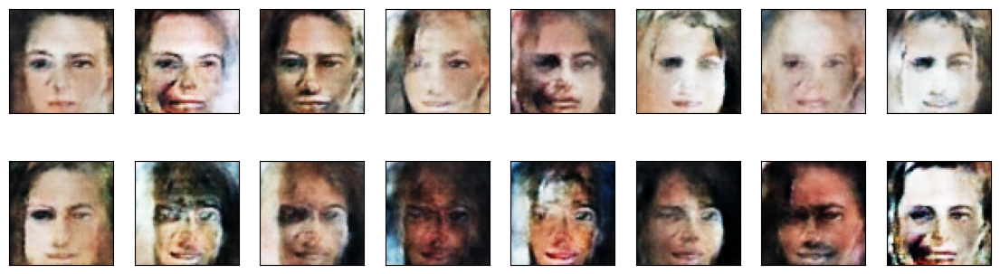

2023-03-29 08:12:39 | Epoch [5/20] | Batch 0/2037 | d_loss: 0.0126 | g_loss: 6.5541
2023-03-29 08:12:40 | Epoch [5/20] | Batch 50/2037 | d_loss: 0.0180 | g_loss: 8.3523
2023-03-29 08:12:40 | Epoch [5/20] | Batch 100/2037 | d_loss: 0.0307 | g_loss: 6.0219
2023-03-29 08:12:41 | Epoch [5/20] | Batch 150/2037 | d_loss: 0.1400 | g_loss: 10.3652
2023-03-29 08:12:41 | Epoch [5/20] | Batch 200/2037 | d_loss: 0.0286 | g_loss: 6.3398
2023-03-29 08:12:41 | Epoch [5/20] | Batch 250/2037 | d_loss: 0.0156 | g_loss: 6.7640
2023-03-29 08:12:42 | Epoch [5/20] | Batch 300/2037 | d_loss: 0.0097 | g_loss: 6.3818
2023-03-29 08:12:42 | Epoch [5/20] | Batch 350/2037 | d_loss: 0.0179 | g_loss: 4.4402
2023-03-29 08:12:42 | Epoch [5/20] | Batch 400/2037 | d_loss: 0.0208 | g_loss: 5.6271
2023-03-29 08:12:43 | Epoch [5/20] | Batch 450/2037 | d_loss: 0.0167 | g_loss: 5.4031
2023-03-29 08:12:43 | Epoch [5/20] | Batch 500/2037 | d_loss: 0.0304 | g_loss: 6.5832
2023-03-29 08:12:43 | Epoch [5/20] | Batch 550/2037 | d_

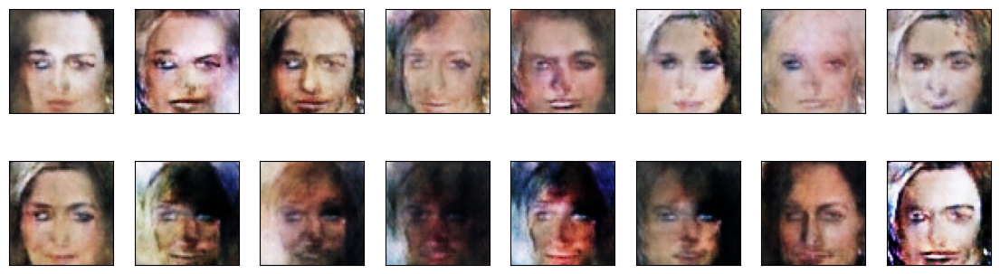

2023-03-29 08:12:55 | Epoch [6/20] | Batch 0/2037 | d_loss: 0.0270 | g_loss: 7.7825
2023-03-29 08:12:55 | Epoch [6/20] | Batch 50/2037 | d_loss: 0.0151 | g_loss: 8.6310
2023-03-29 08:12:56 | Epoch [6/20] | Batch 100/2037 | d_loss: 0.0563 | g_loss: 6.7980
2023-03-29 08:12:56 | Epoch [6/20] | Batch 150/2037 | d_loss: 0.0064 | g_loss: 8.3545
2023-03-29 08:12:56 | Epoch [6/20] | Batch 200/2037 | d_loss: 0.0513 | g_loss: 7.2809
2023-03-29 08:12:57 | Epoch [6/20] | Batch 250/2037 | d_loss: 0.0228 | g_loss: 17.7615
2023-03-29 08:12:57 | Epoch [6/20] | Batch 300/2037 | d_loss: 0.0173 | g_loss: 6.1473
2023-03-29 08:12:57 | Epoch [6/20] | Batch 350/2037 | d_loss: 0.0608 | g_loss: 4.5436
2023-03-29 08:12:58 | Epoch [6/20] | Batch 400/2037 | d_loss: 0.0343 | g_loss: 6.7078
2023-03-29 08:12:58 | Epoch [6/20] | Batch 450/2037 | d_loss: 0.0125 | g_loss: 7.6132
2023-03-29 08:12:58 | Epoch [6/20] | Batch 500/2037 | d_loss: 0.0145 | g_loss: 6.7072
2023-03-29 08:12:59 | Epoch [6/20] | Batch 550/2037 | d_

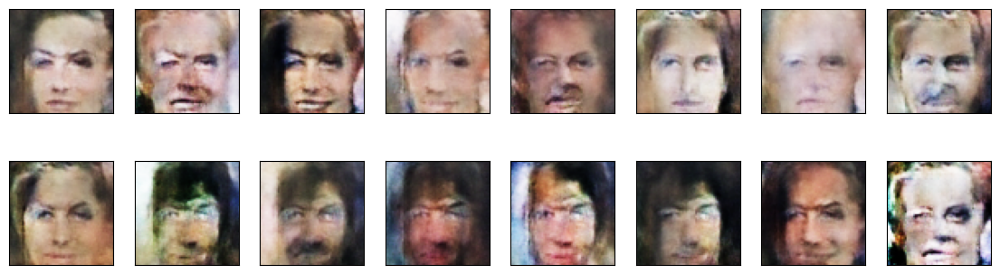

2023-03-29 08:13:10 | Epoch [7/20] | Batch 0/2037 | d_loss: 0.0371 | g_loss: 6.3907
2023-03-29 08:13:10 | Epoch [7/20] | Batch 50/2037 | d_loss: 0.3757 | g_loss: 15.7799
2023-03-29 08:13:11 | Epoch [7/20] | Batch 100/2037 | d_loss: 0.0135 | g_loss: 9.1616
2023-03-29 08:13:11 | Epoch [7/20] | Batch 150/2037 | d_loss: 0.0060 | g_loss: 6.9788
2023-03-29 08:13:12 | Epoch [7/20] | Batch 200/2037 | d_loss: 0.0126 | g_loss: 6.4696
2023-03-29 08:13:12 | Epoch [7/20] | Batch 250/2037 | d_loss: 0.0057 | g_loss: 8.5635
2023-03-29 08:13:13 | Epoch [7/20] | Batch 300/2037 | d_loss: 0.0016 | g_loss: 6.7401
2023-03-29 08:13:13 | Epoch [7/20] | Batch 350/2037 | d_loss: 0.0095 | g_loss: 5.2425
2023-03-29 08:13:14 | Epoch [7/20] | Batch 400/2037 | d_loss: 0.0199 | g_loss: 8.5647
2023-03-29 08:13:14 | Epoch [7/20] | Batch 450/2037 | d_loss: 0.0717 | g_loss: 7.3098
2023-03-29 08:13:15 | Epoch [7/20] | Batch 500/2037 | d_loss: 3.6562 | g_loss: 5.8072
2023-03-29 08:13:15 | Epoch [7/20] | Batch 550/2037 | d_

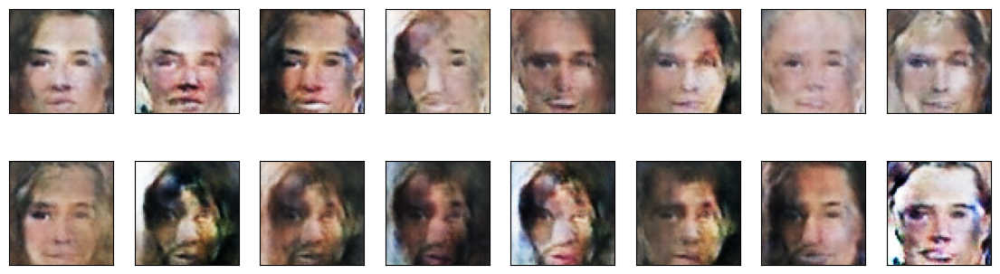

2023-03-29 08:13:30 | Epoch [8/20] | Batch 0/2037 | d_loss: 0.2033 | g_loss: 4.0557
2023-03-29 08:13:30 | Epoch [8/20] | Batch 50/2037 | d_loss: 0.0096 | g_loss: 6.3341
2023-03-29 08:13:31 | Epoch [8/20] | Batch 100/2037 | d_loss: 0.1713 | g_loss: 11.8764
2023-03-29 08:13:31 | Epoch [8/20] | Batch 150/2037 | d_loss: 0.0273 | g_loss: 6.7795
2023-03-29 08:13:32 | Epoch [8/20] | Batch 200/2037 | d_loss: 0.0231 | g_loss: 5.3447
2023-03-29 08:13:32 | Epoch [8/20] | Batch 250/2037 | d_loss: 0.0178 | g_loss: 8.9958
2023-03-29 08:13:32 | Epoch [8/20] | Batch 300/2037 | d_loss: 0.0121 | g_loss: 6.6003
2023-03-29 08:13:33 | Epoch [8/20] | Batch 350/2037 | d_loss: 0.0048 | g_loss: 8.3206
2023-03-29 08:13:33 | Epoch [8/20] | Batch 400/2037 | d_loss: 0.0700 | g_loss: 7.7647
2023-03-29 08:13:34 | Epoch [8/20] | Batch 450/2037 | d_loss: 0.1552 | g_loss: 11.7929
2023-03-29 08:13:34 | Epoch [8/20] | Batch 500/2037 | d_loss: 0.0096 | g_loss: 6.8399
2023-03-29 08:13:34 | Epoch [8/20] | Batch 550/2037 | d

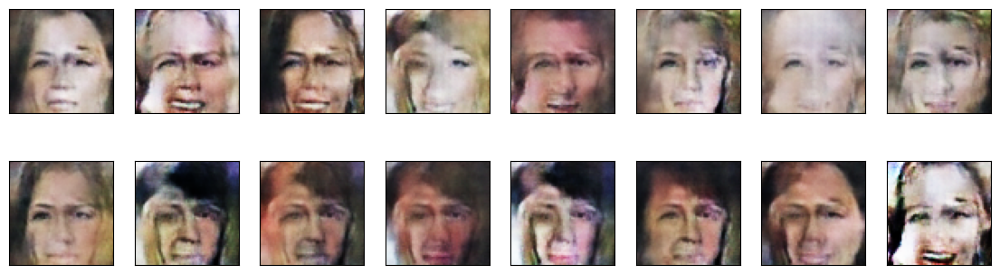

2023-03-29 08:13:47 | Epoch [9/20] | Batch 0/2037 | d_loss: 0.0028 | g_loss: 8.8556
2023-03-29 08:13:47 | Epoch [9/20] | Batch 50/2037 | d_loss: 0.0039 | g_loss: 9.3064
2023-03-29 08:13:48 | Epoch [9/20] | Batch 100/2037 | d_loss: 0.0063 | g_loss: 9.6468
2023-03-29 08:13:48 | Epoch [9/20] | Batch 150/2037 | d_loss: 0.0028 | g_loss: 13.1376
2023-03-29 08:13:48 | Epoch [9/20] | Batch 200/2037 | d_loss: 0.0111 | g_loss: 7.1947
2023-03-29 08:13:49 | Epoch [9/20] | Batch 250/2037 | d_loss: 0.0187 | g_loss: 5.0586
2023-03-29 08:13:49 | Epoch [9/20] | Batch 300/2037 | d_loss: 0.0066 | g_loss: 8.7816
2023-03-29 08:13:50 | Epoch [9/20] | Batch 350/2037 | d_loss: 0.0393 | g_loss: 7.8563
2023-03-29 08:13:50 | Epoch [9/20] | Batch 400/2037 | d_loss: 0.0054 | g_loss: 8.0630
2023-03-29 08:13:50 | Epoch [9/20] | Batch 450/2037 | d_loss: 0.0523 | g_loss: 7.0038
2023-03-29 08:13:51 | Epoch [9/20] | Batch 500/2037 | d_loss: 0.0057 | g_loss: 13.6994
2023-03-29 08:13:51 | Epoch [9/20] | Batch 550/2037 | d

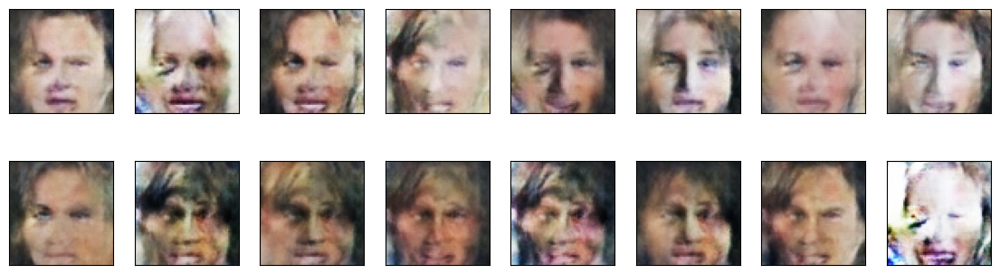

2023-03-29 08:14:05 | Epoch [10/20] | Batch 0/2037 | d_loss: 0.0065 | g_loss: 7.9365
2023-03-29 08:14:06 | Epoch [10/20] | Batch 50/2037 | d_loss: 0.0101 | g_loss: 9.6148
2023-03-29 08:14:06 | Epoch [10/20] | Batch 100/2037 | d_loss: 0.0027 | g_loss: 7.3818
2023-03-29 08:14:07 | Epoch [10/20] | Batch 150/2037 | d_loss: 0.0051 | g_loss: 6.3822
2023-03-29 08:14:07 | Epoch [10/20] | Batch 200/2037 | d_loss: 0.0297 | g_loss: 5.0129
2023-03-29 08:14:07 | Epoch [10/20] | Batch 250/2037 | d_loss: 0.0148 | g_loss: 7.1137
2023-03-29 08:14:08 | Epoch [10/20] | Batch 300/2037 | d_loss: 0.0519 | g_loss: 7.3458
2023-03-29 08:14:08 | Epoch [10/20] | Batch 350/2037 | d_loss: 0.0076 | g_loss: 7.5635
2023-03-29 08:14:09 | Epoch [10/20] | Batch 400/2037 | d_loss: 0.0134 | g_loss: 9.9250
2023-03-29 08:14:09 | Epoch [10/20] | Batch 450/2037 | d_loss: 0.0086 | g_loss: 7.3996
2023-03-29 08:14:09 | Epoch [10/20] | Batch 500/2037 | d_loss: 0.0101 | g_loss: 6.5977
2023-03-29 08:14:10 | Epoch [10/20] | Batch 55

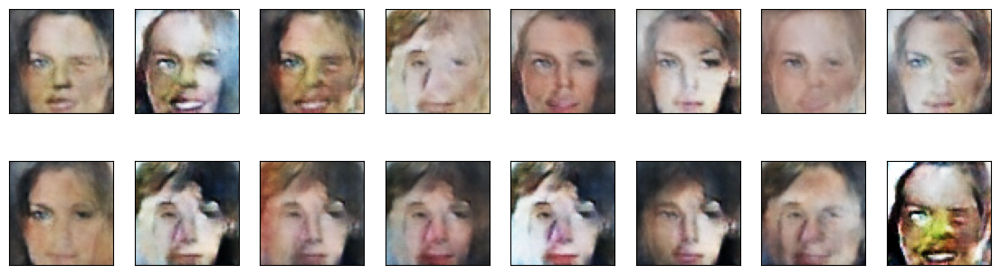

2023-03-29 08:14:23 | Epoch [11/20] | Batch 0/2037 | d_loss: 0.0009 | g_loss: 7.5847
2023-03-29 08:14:24 | Epoch [11/20] | Batch 50/2037 | d_loss: 0.0427 | g_loss: 10.9396
2023-03-29 08:14:24 | Epoch [11/20] | Batch 100/2037 | d_loss: 0.0015 | g_loss: 5.7524
2023-03-29 08:14:25 | Epoch [11/20] | Batch 150/2037 | d_loss: 0.0228 | g_loss: 11.7257
2023-03-29 08:14:25 | Epoch [11/20] | Batch 200/2037 | d_loss: 0.0072 | g_loss: 11.4717
2023-03-29 08:14:26 | Epoch [11/20] | Batch 250/2037 | d_loss: 0.0631 | g_loss: 8.7084
2023-03-29 08:14:26 | Epoch [11/20] | Batch 300/2037 | d_loss: 0.1411 | g_loss: 13.6698
2023-03-29 08:14:27 | Epoch [11/20] | Batch 350/2037 | d_loss: 0.0035 | g_loss: 12.0852
2023-03-29 08:14:27 | Epoch [11/20] | Batch 400/2037 | d_loss: 0.0073 | g_loss: 8.2269
2023-03-29 08:14:28 | Epoch [11/20] | Batch 450/2037 | d_loss: 0.0049 | g_loss: 11.1816
2023-03-29 08:14:28 | Epoch [11/20] | Batch 500/2037 | d_loss: 0.0013 | g_loss: 11.0766
2023-03-29 08:14:28 | Epoch [11/20] | B

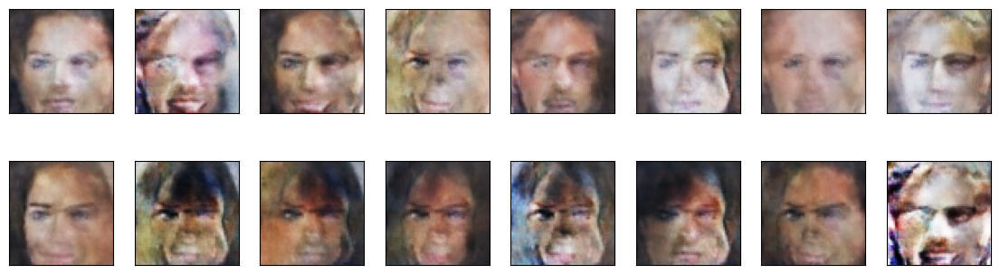

2023-03-29 08:14:43 | Epoch [12/20] | Batch 0/2037 | d_loss: 0.0049 | g_loss: 11.1070
2023-03-29 08:14:43 | Epoch [12/20] | Batch 50/2037 | d_loss: 0.0454 | g_loss: 7.0232
2023-03-29 08:14:44 | Epoch [12/20] | Batch 100/2037 | d_loss: 0.0126 | g_loss: 5.2684
2023-03-29 08:14:44 | Epoch [12/20] | Batch 150/2037 | d_loss: 0.2389 | g_loss: 6.8230
2023-03-29 08:14:44 | Epoch [12/20] | Batch 200/2037 | d_loss: 0.0277 | g_loss: 7.4238
2023-03-29 08:14:45 | Epoch [12/20] | Batch 250/2037 | d_loss: 0.1168 | g_loss: 8.5927
2023-03-29 08:14:45 | Epoch [12/20] | Batch 300/2037 | d_loss: 0.0017 | g_loss: 9.2163
2023-03-29 08:14:46 | Epoch [12/20] | Batch 350/2037 | d_loss: 0.1950 | g_loss: 10.2758
2023-03-29 08:14:46 | Epoch [12/20] | Batch 400/2037 | d_loss: 0.0393 | g_loss: 7.2294
2023-03-29 08:14:46 | Epoch [12/20] | Batch 450/2037 | d_loss: 0.0330 | g_loss: 7.9801
2023-03-29 08:14:47 | Epoch [12/20] | Batch 500/2037 | d_loss: 0.0136 | g_loss: 8.2627
2023-03-29 08:14:47 | Epoch [12/20] | Batch 

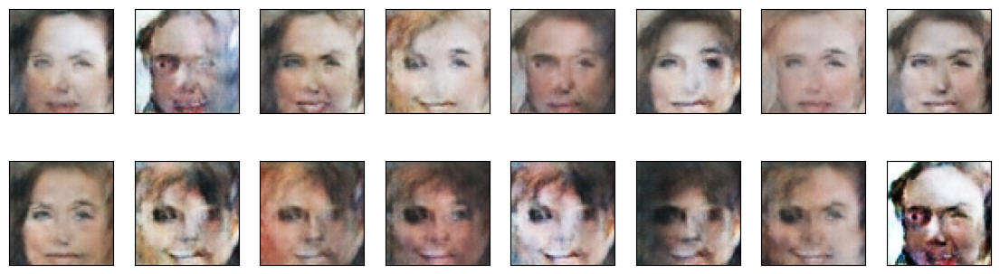

2023-03-29 08:15:01 | Epoch [13/20] | Batch 0/2037 | d_loss: 0.0039 | g_loss: 14.2368
2023-03-29 08:15:01 | Epoch [13/20] | Batch 50/2037 | d_loss: 0.0271 | g_loss: 4.9988
2023-03-29 08:15:02 | Epoch [13/20] | Batch 100/2037 | d_loss: 0.0371 | g_loss: 6.3481
2023-03-29 08:15:02 | Epoch [13/20] | Batch 150/2037 | d_loss: 0.0109 | g_loss: 10.0113
2023-03-29 08:15:03 | Epoch [13/20] | Batch 200/2037 | d_loss: 0.0033 | g_loss: 6.6725
2023-03-29 08:15:03 | Epoch [13/20] | Batch 250/2037 | d_loss: 0.0269 | g_loss: 6.6035
2023-03-29 08:15:04 | Epoch [13/20] | Batch 300/2037 | d_loss: 0.0035 | g_loss: 9.5555
2023-03-29 08:15:04 | Epoch [13/20] | Batch 350/2037 | d_loss: 0.0124 | g_loss: 8.5191
2023-03-29 08:15:05 | Epoch [13/20] | Batch 400/2037 | d_loss: 0.0063 | g_loss: 9.5165
2023-03-29 08:15:05 | Epoch [13/20] | Batch 450/2037 | d_loss: 0.0050 | g_loss: 9.1644
2023-03-29 08:15:05 | Epoch [13/20] | Batch 500/2037 | d_loss: 0.0368 | g_loss: 13.1677
2023-03-29 08:15:06 | Epoch [13/20] | Batch

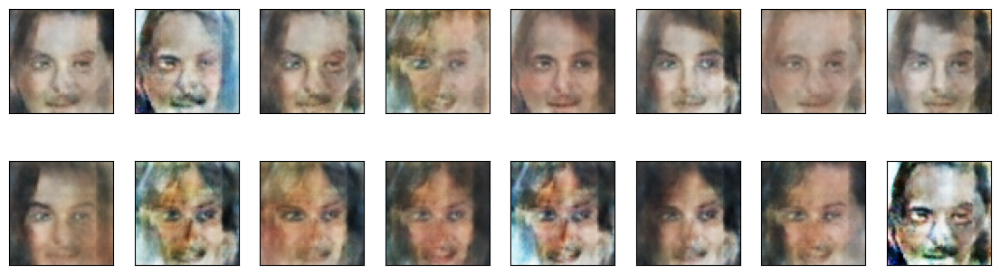

2023-03-29 08:15:21 | Epoch [14/20] | Batch 0/2037 | d_loss: 0.0398 | g_loss: 8.7968
2023-03-29 08:15:22 | Epoch [14/20] | Batch 50/2037 | d_loss: 0.1337 | g_loss: 12.2099
2023-03-29 08:15:22 | Epoch [14/20] | Batch 100/2037 | d_loss: 0.0437 | g_loss: 13.0962
2023-03-29 08:15:23 | Epoch [14/20] | Batch 150/2037 | d_loss: 0.0256 | g_loss: 5.8633
2023-03-29 08:15:23 | Epoch [14/20] | Batch 200/2037 | d_loss: 0.0017 | g_loss: 7.7816
2023-03-29 08:15:24 | Epoch [14/20] | Batch 250/2037 | d_loss: 0.0541 | g_loss: 3.8494
2023-03-29 08:15:24 | Epoch [14/20] | Batch 300/2037 | d_loss: 0.0975 | g_loss: 7.0842
2023-03-29 08:15:25 | Epoch [14/20] | Batch 350/2037 | d_loss: 0.0307 | g_loss: 6.9828
2023-03-29 08:15:25 | Epoch [14/20] | Batch 400/2037 | d_loss: 0.0036 | g_loss: 5.1222
2023-03-29 08:15:26 | Epoch [14/20] | Batch 450/2037 | d_loss: 0.0032 | g_loss: 8.2369
2023-03-29 08:15:26 | Epoch [14/20] | Batch 500/2037 | d_loss: 0.0219 | g_loss: 6.9422
2023-03-29 08:15:26 | Epoch [14/20] | Batch 

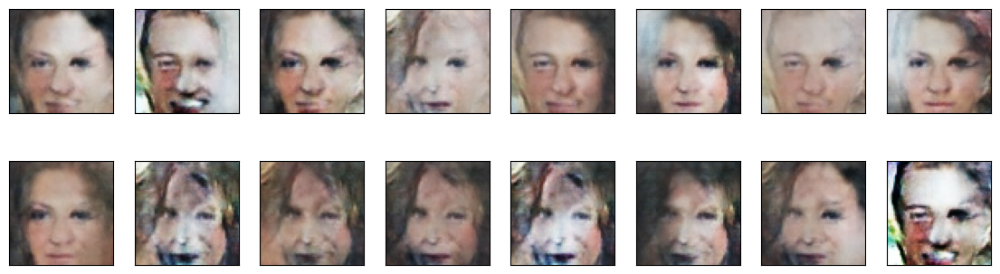

2023-03-29 08:15:42 | Epoch [15/20] | Batch 0/2037 | d_loss: 0.0009 | g_loss: 5.7378
2023-03-29 08:15:42 | Epoch [15/20] | Batch 50/2037 | d_loss: 0.2302 | g_loss: 12.1816
2023-03-29 08:15:42 | Epoch [15/20] | Batch 100/2037 | d_loss: 0.0541 | g_loss: 9.2532
2023-03-29 08:15:43 | Epoch [15/20] | Batch 150/2037 | d_loss: 0.0006 | g_loss: 8.0660
2023-03-29 08:15:43 | Epoch [15/20] | Batch 200/2037 | d_loss: 0.0020 | g_loss: 10.8774
2023-03-29 08:15:44 | Epoch [15/20] | Batch 250/2037 | d_loss: 0.0030 | g_loss: 9.2888
2023-03-29 08:15:44 | Epoch [15/20] | Batch 300/2037 | d_loss: 0.0088 | g_loss: 7.6111
2023-03-29 08:15:44 | Epoch [15/20] | Batch 350/2037 | d_loss: 0.0520 | g_loss: 5.9081
2023-03-29 08:15:45 | Epoch [15/20] | Batch 400/2037 | d_loss: 0.0014 | g_loss: 8.2788
2023-03-29 08:15:45 | Epoch [15/20] | Batch 450/2037 | d_loss: 0.0304 | g_loss: 11.0570
2023-03-29 08:15:46 | Epoch [15/20] | Batch 500/2037 | d_loss: 0.0002 | g_loss: 8.2607
2023-03-29 08:15:46 | Epoch [15/20] | Batch

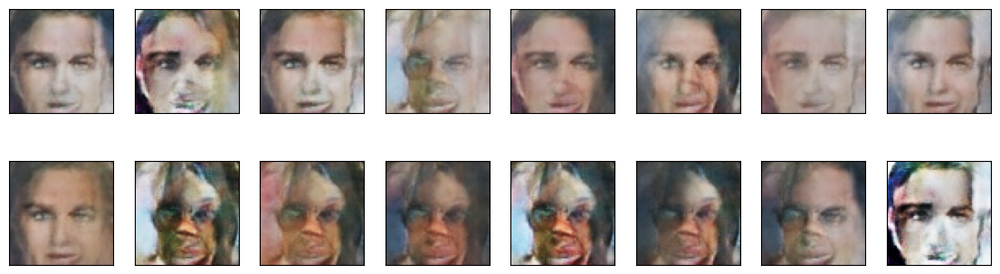

2023-03-29 08:15:58 | Epoch [16/20] | Batch 0/2037 | d_loss: 0.0149 | g_loss: 23.0629
2023-03-29 08:15:58 | Epoch [16/20] | Batch 50/2037 | d_loss: 0.0022 | g_loss: 6.2459
2023-03-29 08:15:59 | Epoch [16/20] | Batch 100/2037 | d_loss: 0.0064 | g_loss: 9.4489
2023-03-29 08:15:59 | Epoch [16/20] | Batch 150/2037 | d_loss: 0.0033 | g_loss: 11.8799
2023-03-29 08:15:59 | Epoch [16/20] | Batch 200/2037 | d_loss: 0.0050 | g_loss: 10.3004
2023-03-29 08:16:00 | Epoch [16/20] | Batch 250/2037 | d_loss: 0.0018 | g_loss: 12.8312
2023-03-29 08:16:00 | Epoch [16/20] | Batch 300/2037 | d_loss: 0.0013 | g_loss: 8.6087
2023-03-29 08:16:00 | Epoch [16/20] | Batch 350/2037 | d_loss: 0.0189 | g_loss: 16.1197
2023-03-29 08:16:01 | Epoch [16/20] | Batch 400/2037 | d_loss: 0.5169 | g_loss: 6.5414
2023-03-29 08:16:01 | Epoch [16/20] | Batch 450/2037 | d_loss: 0.0017 | g_loss: 12.8988
2023-03-29 08:16:01 | Epoch [16/20] | Batch 500/2037 | d_loss: 0.0170 | g_loss: 6.6232
2023-03-29 08:16:02 | Epoch [16/20] | Ba

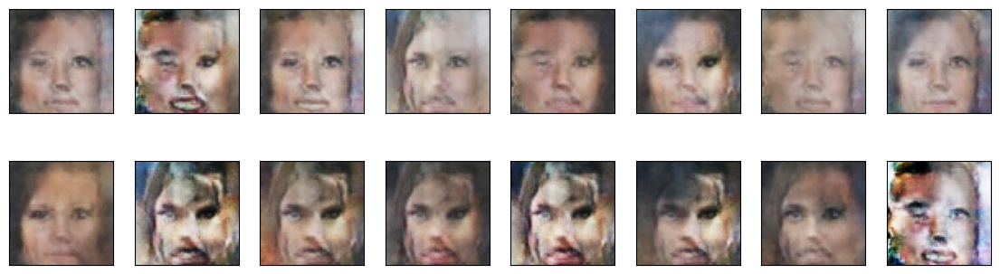

2023-03-29 08:16:15 | Epoch [17/20] | Batch 0/2037 | d_loss: 0.1000 | g_loss: 15.8426
2023-03-29 08:16:15 | Epoch [17/20] | Batch 50/2037 | d_loss: 0.0107 | g_loss: 10.6461
2023-03-29 08:16:16 | Epoch [17/20] | Batch 100/2037 | d_loss: 0.1642 | g_loss: 5.5323
2023-03-29 08:16:16 | Epoch [17/20] | Batch 150/2037 | d_loss: 0.0161 | g_loss: 12.2624
2023-03-29 08:16:17 | Epoch [17/20] | Batch 200/2037 | d_loss: 0.0098 | g_loss: 5.6112
2023-03-29 08:16:17 | Epoch [17/20] | Batch 250/2037 | d_loss: 0.0283 | g_loss: 3.2819
2023-03-29 08:16:17 | Epoch [17/20] | Batch 300/2037 | d_loss: 0.9589 | g_loss: 26.5380
2023-03-29 08:16:18 | Epoch [17/20] | Batch 350/2037 | d_loss: 0.0103 | g_loss: 7.2199
2023-03-29 08:16:18 | Epoch [17/20] | Batch 400/2037 | d_loss: 0.2343 | g_loss: 4.8998
2023-03-29 08:16:19 | Epoch [17/20] | Batch 450/2037 | d_loss: 0.0114 | g_loss: 10.8386
2023-03-29 08:16:19 | Epoch [17/20] | Batch 500/2037 | d_loss: 0.0014 | g_loss: 7.0174
2023-03-29 08:16:19 | Epoch [17/20] | Bat

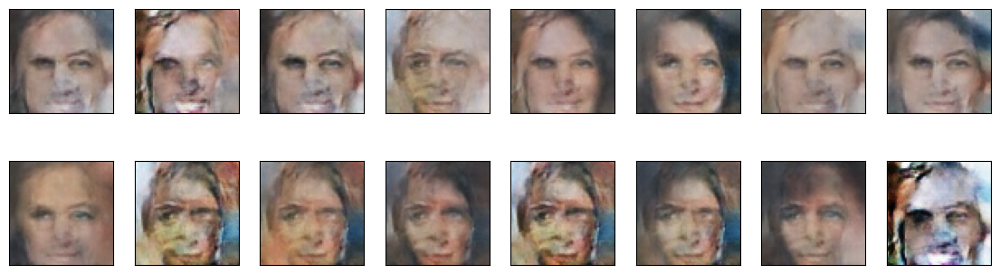

2023-03-29 08:16:32 | Epoch [18/20] | Batch 0/2037 | d_loss: 0.0001 | g_loss: 13.8737
2023-03-29 08:16:33 | Epoch [18/20] | Batch 50/2037 | d_loss: 0.0951 | g_loss: 7.1946
2023-03-29 08:16:33 | Epoch [18/20] | Batch 100/2037 | d_loss: 0.0049 | g_loss: 9.1975
2023-03-29 08:16:34 | Epoch [18/20] | Batch 150/2037 | d_loss: 0.0259 | g_loss: 6.8001
2023-03-29 08:16:34 | Epoch [18/20] | Batch 200/2037 | d_loss: 0.0189 | g_loss: 6.7965
2023-03-29 08:16:34 | Epoch [18/20] | Batch 250/2037 | d_loss: 0.0094 | g_loss: 8.6675
2023-03-29 08:16:35 | Epoch [18/20] | Batch 300/2037 | d_loss: 0.0119 | g_loss: 5.6003
2023-03-29 08:16:35 | Epoch [18/20] | Batch 350/2037 | d_loss: 0.0022 | g_loss: 7.1329
2023-03-29 08:16:35 | Epoch [18/20] | Batch 400/2037 | d_loss: 0.0863 | g_loss: 2.2710
2023-03-29 08:16:36 | Epoch [18/20] | Batch 450/2037 | d_loss: 0.0003 | g_loss: 9.2278
2023-03-29 08:16:36 | Epoch [18/20] | Batch 500/2037 | d_loss: 0.0177 | g_loss: 11.3996
2023-03-29 08:16:37 | Epoch [18/20] | Batch 

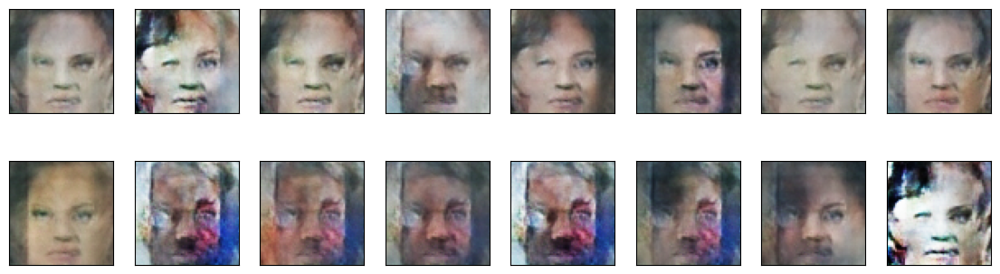

2023-03-29 08:16:49 | Epoch [19/20] | Batch 0/2037 | d_loss: 0.0028 | g_loss: 11.5295
2023-03-29 08:16:49 | Epoch [19/20] | Batch 50/2037 | d_loss: 0.0095 | g_loss: 8.4037
2023-03-29 08:16:50 | Epoch [19/20] | Batch 100/2037 | d_loss: 0.0164 | g_loss: 8.4573
2023-03-29 08:16:50 | Epoch [19/20] | Batch 150/2037 | d_loss: 0.0410 | g_loss: 6.8337
2023-03-29 08:16:51 | Epoch [19/20] | Batch 200/2037 | d_loss: 1.9300 | g_loss: 31.1873
2023-03-29 08:16:51 | Epoch [19/20] | Batch 250/2037 | d_loss: 0.0917 | g_loss: 6.8614
2023-03-29 08:16:51 | Epoch [19/20] | Batch 300/2037 | d_loss: 0.0005 | g_loss: 7.8884
2023-03-29 08:16:52 | Epoch [19/20] | Batch 350/2037 | d_loss: 0.0022 | g_loss: 6.6735
2023-03-29 08:16:52 | Epoch [19/20] | Batch 400/2037 | d_loss: 0.0016 | g_loss: 8.4392
2023-03-29 08:16:53 | Epoch [19/20] | Batch 450/2037 | d_loss: 0.0091 | g_loss: 6.6367
2023-03-29 08:16:53 | Epoch [19/20] | Batch 500/2037 | d_loss: 0.0002 | g_loss: 12.5219
2023-03-29 08:16:54 | Epoch [19/20] | Batch

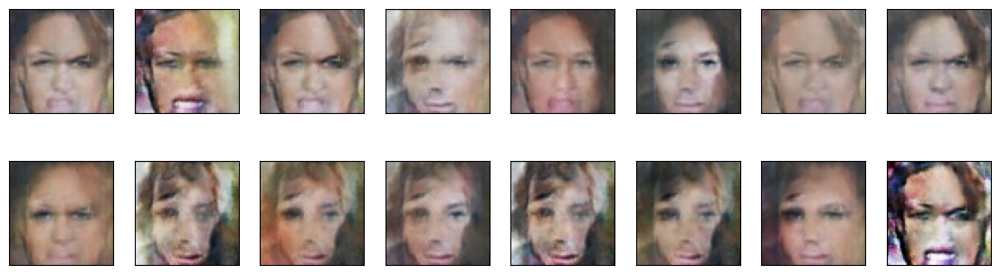

2023-03-29 08:17:08 | Epoch [20/20] | Batch 0/2037 | d_loss: 0.0091 | g_loss: 6.2780
2023-03-29 08:17:08 | Epoch [20/20] | Batch 50/2037 | d_loss: 0.0112 | g_loss: 6.9933
2023-03-29 08:17:09 | Epoch [20/20] | Batch 100/2037 | d_loss: 0.0003 | g_loss: 9.7276
2023-03-29 08:17:09 | Epoch [20/20] | Batch 150/2037 | d_loss: 0.0053 | g_loss: 13.2806
2023-03-29 08:17:09 | Epoch [20/20] | Batch 200/2037 | d_loss: 0.0241 | g_loss: 10.0502
2023-03-29 08:17:10 | Epoch [20/20] | Batch 250/2037 | d_loss: 0.0024 | g_loss: 9.4110
2023-03-29 08:17:10 | Epoch [20/20] | Batch 300/2037 | d_loss: 0.0023 | g_loss: 7.2118
2023-03-29 08:17:10 | Epoch [20/20] | Batch 350/2037 | d_loss: 0.0001 | g_loss: 18.0405
2023-03-29 08:17:11 | Epoch [20/20] | Batch 400/2037 | d_loss: 0.0039 | g_loss: 7.9452
2023-03-29 08:17:11 | Epoch [20/20] | Batch 450/2037 | d_loss: 0.0010 | g_loss: 9.0467
2023-03-29 08:17:11 | Epoch [20/20] | Batch 500/2037 | d_loss: 0.0016 | g_loss: 11.3384
2023-03-29 08:17:12 | Epoch [20/20] | Batc

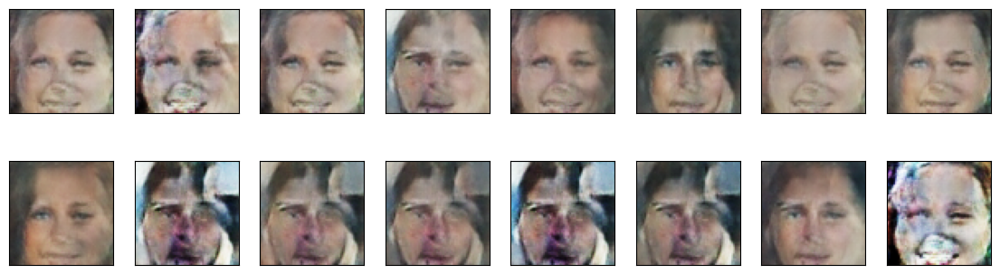

In [25]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()
z_size = 128

# training hyperparams
n_epochs = 20

# keep track of loss and generated, "fake" samples
samples = []
losses = []


for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device).float()
        batch_size = real_images.size(0)
        
        ####################################
        
        # TODO: implement the training strategy
        # ============================================
        #            TRAIN THE DISCRIMINATOR
        # ============================================
        
        d_optimizer.zero_grad()
        
        # 1. Train with real images

        # Compute the discriminator losses on real images 
        if train_on_gpu:
            real_images = real_images.cuda()
        
        D_real = discriminator(real_images)
        d_real_loss = real_loss(D_real)
        
        # 2. Train with fake images
        
        # Generate fake images
        z = np.random.uniform(-1, 1, size=(batch_size, z_size, 1, 1))
        z = torch.from_numpy(z).float()
        # move x to GPU, if available
        if train_on_gpu:
            z = z.cuda()
        fake_images = generator(z)
        
        # Compute the discriminator losses on fake images            
        D_fake = discriminator(fake_images.detach())
        d_fake_loss = fake_loss(D_fake)
        
        # add up loss and perform backprop
        d_loss = d_real_loss + d_fake_loss
        d_loss.backward()
        d_optimizer.step()
                
        # =========================================
        #            TRAIN THE GENERATOR
        # =========================================
        g_optimizer.zero_grad()
        
        # 1. Train with fake images and flipped labels
        
        # Generate fake images
        z = np.random.uniform(-1, 1, size=(batch_size, z_size, 1, 1))
        z = torch.from_numpy(z).float()
        if train_on_gpu:
            z = z.cuda()
        fake_images = generator(z)
        
        # Compute the discriminator losses on fake images 
        # using flipped labels!
        D_fake = discriminator(fake_images)
        g_loss = real_loss(D_fake) # use real loss to flip labels
        
        # perform backprop
        g_loss.backward()
        g_optimizer.step()
        
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d, g = d_loss.item(), g_loss.item()
            # d = d_loss['loss'].item()
            # g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

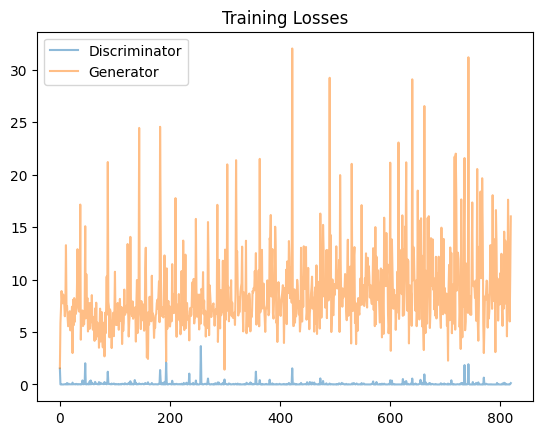

In [26]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)

Larger models have the opportunity to learn more features, but the resolutions of the images are very poor which makes it harder to deepen the network. Optimizers and number of epochs affect the final result.

As noted above, the biased dataset makes it harder for the network to innovate. The faces are mostly white, and most of them follow Hollywood's starndards of beauty that often don't reflect what the real people look like.

The model has been trained for 10 epochs and the improvements can also be seen visually.



### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.